# **Preparing Dependancies**

In [1]:
!pip install diffusers transformers accelerate safetensors

In [2]:
import torch
import numpy as np
import PIL.Image
from PIL import Image
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline,
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler
)
from transformers import AutoImageProcessor, Mask2FormerForUniversalSegmentation
from IPython.display import display


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [3]:
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [4]:
def generate_simple_image(prompt, negative_prompt, seed):
    generator = torch.Generator(device="cuda").manual_seed(seed)
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator
    ).images[0]
    return image

def generate_advanced_image(prompt, negative_prompt, seed, guidance_scale=7.5, num_inference_steps=30):
    generator = torch.Generator(device="cuda").manual_seed(seed)
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]
    return image


## **Generate Image**

  0%|          | 0/50 [00:00<?, ?it/s]

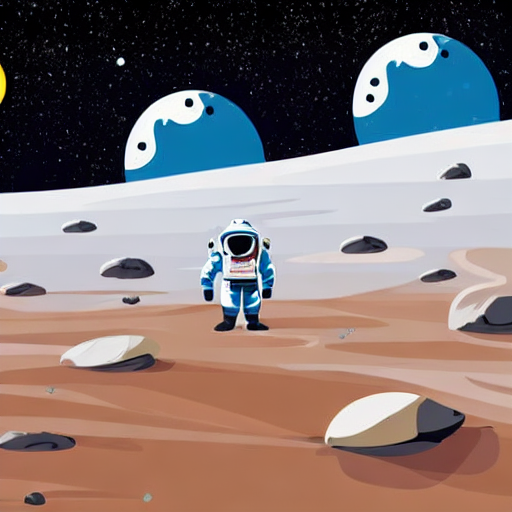

In [5]:
prompt = (
    "a cartoon astronaut in a white spacesuit, standing on the moon surface, "
    "large blue earth partially visible on the upper right background, cut off by the lunar horizon, "
    "starry black sky, gray lunar terrain with craters, "
    "cartoon style, flat illustration, clean linework, vibrant colors, high quality"
)
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration, "
    "extra limbs, deformed, text, watermark"
)
seed = 222

image_simple = generate_simple_image(prompt, negative_prompt, seed)

image_simple


## **Generate Image with Hyperparameter Configuration**

  0%|          | 0/30 [00:00<?, ?it/s]

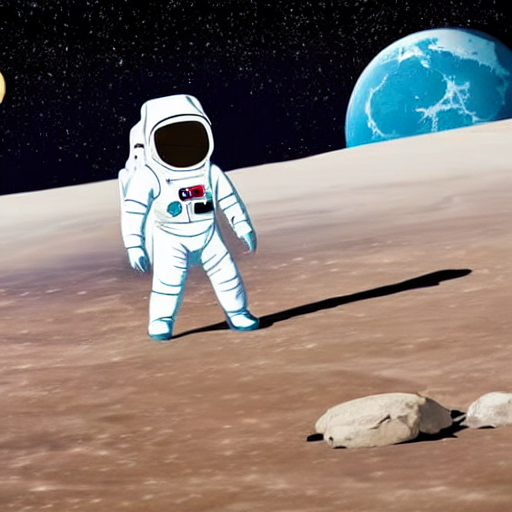

In [6]:
image_advanced = generate_advanced_image(
    prompt=prompt,
    negative_prompt=negative_prompt,
    seed=seed,
    guidance_scale=7.5,
    num_inference_steps=30
)

image_advanced

## **Guidance Scale Comparison**

  0%|          | 0/30 [00:00<?, ?it/s]

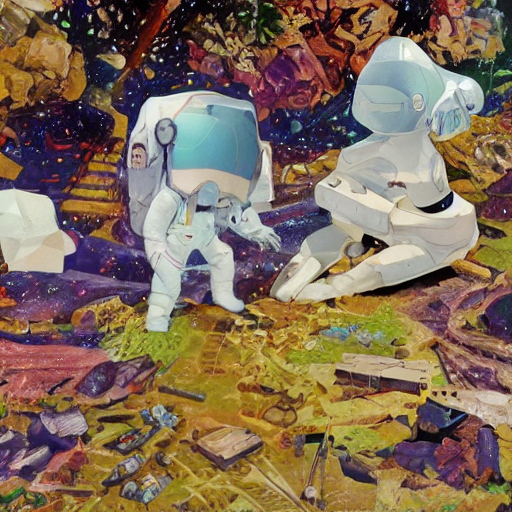

  0%|          | 0/30 [00:00<?, ?it/s]

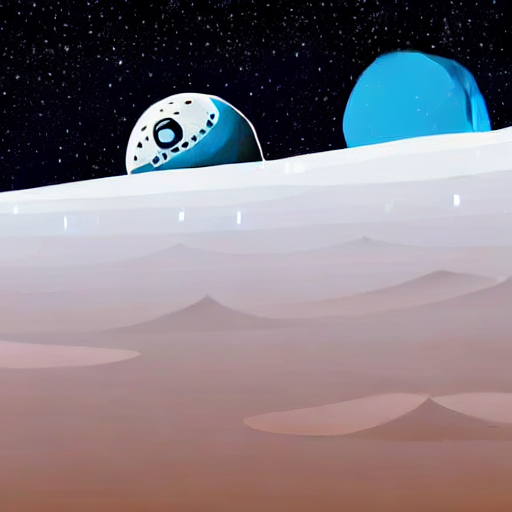

In [7]:
# Menggunakan prompt dan negative_prompt yang sama dengan generate_simple_image
n_prompt = negative_prompt

img_low_cfg = generate_advanced_image(prompt, n_prompt, 222, guidance_scale=1.0, num_inference_steps=30)
display(img_low_cfg)

img_high_cfg = generate_advanced_image(prompt, n_prompt, 222, guidance_scale=15.0, num_inference_steps=30)
display(img_high_cfg)


### **Guidance Scale Explanation:**

* **Gambar dengan "Scale" Rendah (guidance_scale=1.0):**  
  Gambar yang dihasilkan cenderung kurang terikat dengan prompt. Warna dan komposisi terlihat lebih bebas dan bervariasi,   namun elemen-elemen penting seperti astronaut, permukaan bulan, dan bumi di latar belakang bisa tidak muncul secara jelas.   Detail visual terlihat kabur dan tidak konsisten dengan deskripsi prompt.

* **Gambar dengan "Scale" Tinggi (guidance_scale=15.0):**  
  Gambar jauh lebih sesuai dengan prompt. Astronaut, permukaan bulan bertekstur, dan bumi terlihat lebih jelas dan detail.   Namun pada nilai yang terlalu tinggi, gambar bisa terlihat oversaturated atau memiliki artefak visual akibat model terlalu   terpaku pada teks prompt tanpa fleksibilitas kreatif.


## **Inference Steps Comparison**

  0%|          | 0/5 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


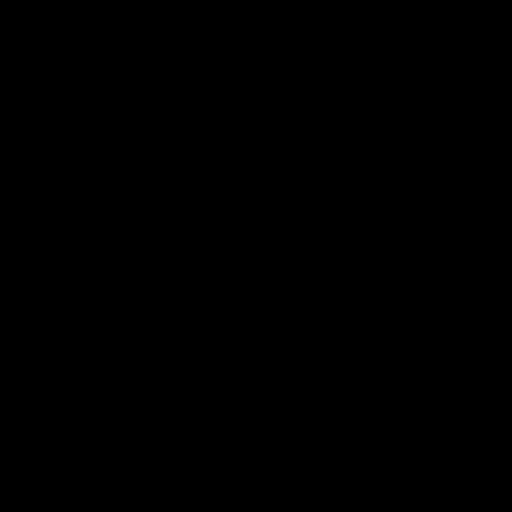

  0%|          | 0/50 [00:00<?, ?it/s]

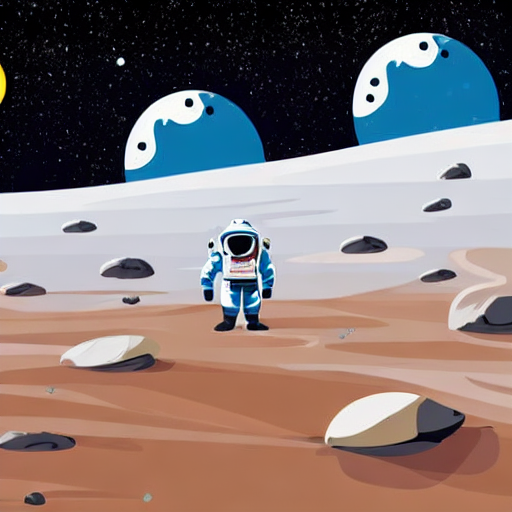

In [8]:
img_low_steps = generate_advanced_image(prompt, n_prompt, 222, guidance_scale=7.5, num_inference_steps=20)
display(img_low_steps)

img_high_steps = generate_advanced_image(prompt, n_prompt, 222, guidance_scale=7.5, num_inference_steps=50)
display(img_high_steps)

### **Inference Step Explanation:**

* **Gambar dengan "Step" Rendah (num_inference_steps=5):**  
  Gambar terlihat kasar, penuh noise, dan detail sangat minim. Proses denoising yang singkat menyebabkan model belum   sempat membentuk struktur visual yang koheren — hasilnya sering berupa bentuk-bentuk buram dan artefak warna yang tidak natural.

* **Gambar dengan "Step" Tinggi (num_inference_steps=50):**  
  Gambar jauh lebih tajam, detail, dan halus. Proses denoising yang lebih panjang memungkinkan model menyempurnakan   struktur gambar secara bertahap, menghasilkan tekstur permukaan bulan yang lebih realistis dan siluet astronaut yang lebih jelas.


## **Batch Inference from One Prompt**

  0%|          | 0/50 [00:00<?, ?it/s]

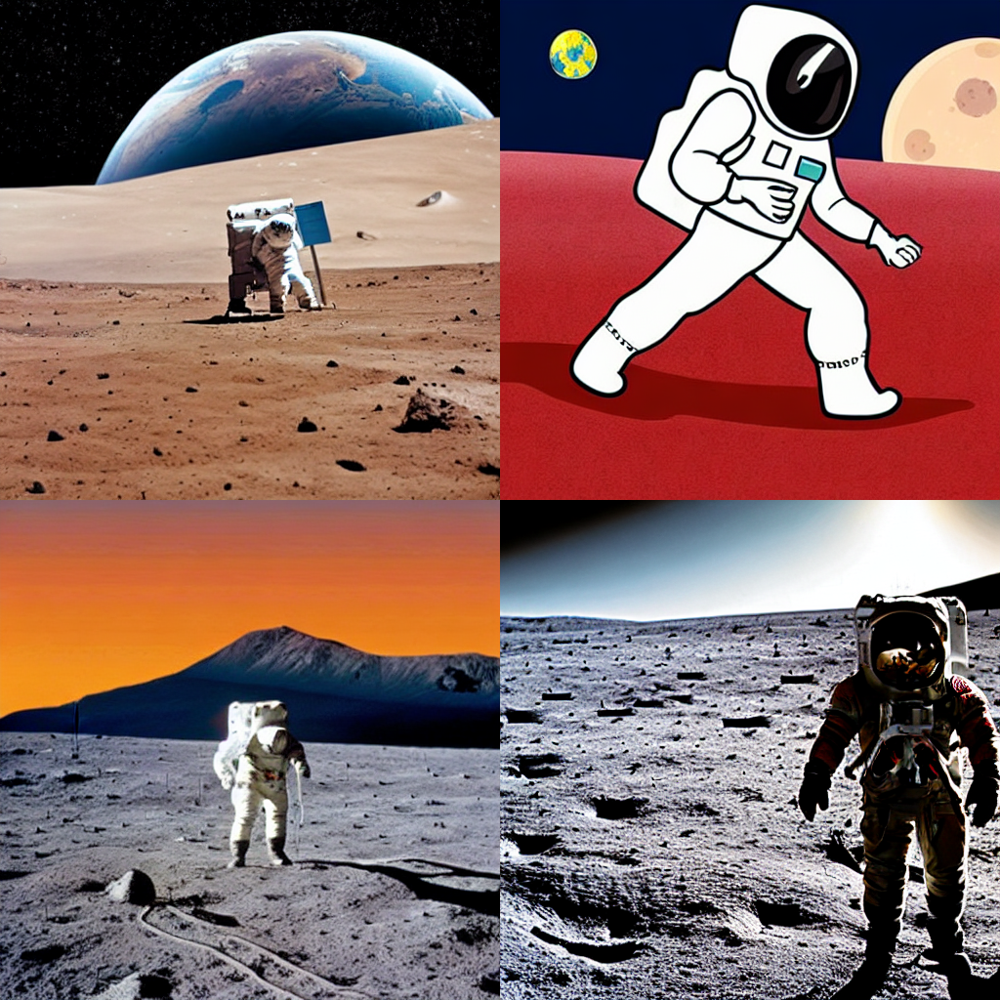

In [9]:
def image_grid(imgs, rows, cols):
    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

batch_prompt = "An astronaut standing on the moon surface, cartoon style, earth partially visible on the right background, high quality"
batch_n_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration, "
    "extra limbs, deformed, text, watermark"
)
generator = torch.Generator("cuda").manual_seed(222)

images = pipe(prompt=[batch_prompt]*4, negative_prompt=[batch_n_prompt]*4, generator=generator).images

grid_result = image_grid(images, rows=2, cols=2)
display(grid_result)


## **Load Scheduler**

Hasil menggunakan Scheduler: Euler A


  0%|          | 0/30 [00:00<?, ?it/s]

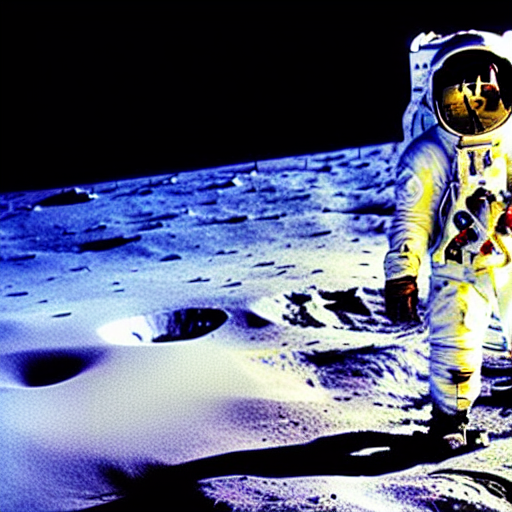

Hasil menggunakan Scheduler: DPM++


  0%|          | 0/30 [00:00<?, ?it/s]

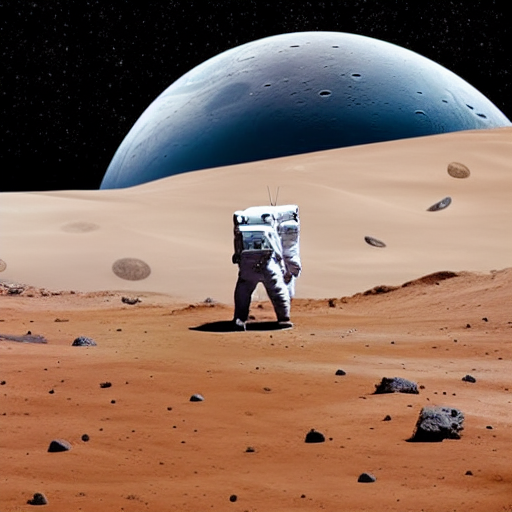

Hasil menggunakan Scheduler: DDIM


  0%|          | 0/30 [00:00<?, ?it/s]

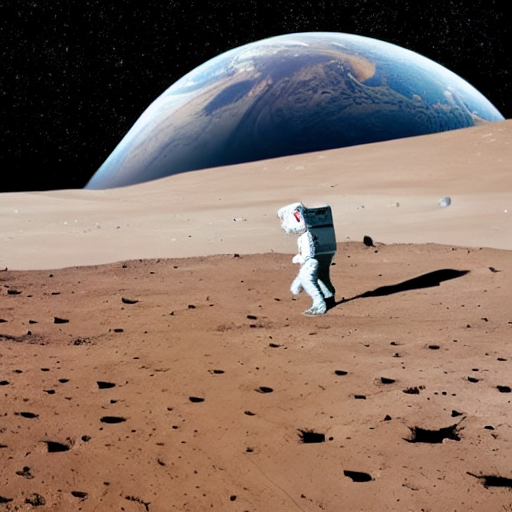

In [10]:
def load_scheduler(pipe, scheduler_name):

    if scheduler_name == "Euler A":
        pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DPM++":
        pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DDIM":
        pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    return pipe

schedulers = ["Euler A", "DPM++", "DDIM"]
for s_name in schedulers:
    print(f"Hasil menggunakan Scheduler: {s_name}")
    pipe = load_scheduler(pipe, s_name)
    img = generate_advanced_image(prompt, n_prompt, 222, 7.5, 30)
    display(img)

### **Scheduler Comparation:**

* **Gambar dengan "Euler A Scheduler":**  
  Menghasilkan gambar dengan variasi kreatif yang lebih tinggi. Detail gambar tampak lebih ekspresif dan dinamis,   cocok untuk gaya cartoon seperti prompt yang digunakan. Warna cenderung lebih cerah dan kontras.

* **Gambar dengan "DPM++ Scheduler":**  
  Menghasilkan gambar yang lebih konsisten dan tajam dibanding Euler A pada jumlah step yang sama.   Struktur visual lebih stabil — elemen-elemen seperti bumi dan permukaan bulan tampak lebih terdefinisi.

* **Gambar dengan "DDIM Scheduler":**  
  Gambar cenderung lebih halus dan deterministik. Output lebih konsisten jika dijalankan ulang dengan seed yang sama.   Cocok digunakan ketika reproducibility menjadi prioritas, meskipun hasil kreatifnya sedikit lebih konservatif dibanding Euler A.


# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Base + Refiner Image Generation**

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

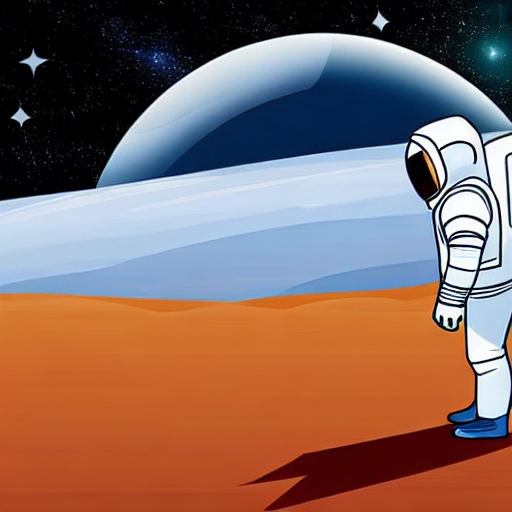

In [11]:
refiner = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

def generate_with_refiner(prompt, n_prompt, seed, denoising_start=0.8, denoising_end=0.8):
    generator = torch.Generator("cuda").manual_seed(seed)
    # Base: generate image hingga denoising_start
    base_image = pipe(
        prompt=prompt,
        negative_prompt=n_prompt,
        generator=generator,
        num_inference_steps=50,
        denoising_end=denoising_start,
        output_type="latent"
    ).images

    # Refiner: lanjutkan dari denoising_start hingga denoising_end
    refined_image = refiner(
        prompt=prompt,
        negative_prompt=n_prompt,
        image=base_image,
        generator=generator,
        num_inference_steps=50,
        denoising_start=denoising_start,
        denoising_end=denoising_end
    ).images[0]
    return refined_image

# Jalankan refiner dengan prompt yang sama
refined_result = generate_with_refiner(prompt, negative_prompt, seed)
display(refined_result)

## **Inpainting**

### **Load Model Inpainting**

In [12]:
inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16
).to("cuda")

def inpaint_engine(image, mask, prompt, negative_prompt=None, guidance_scale=7.5, num_inference_steps=50, seed=9):
    """
    Fungsi tunggal untuk semua proses inpainting.
    
    Args:
        image: PIL Image input
        mask: PIL Image mask (putih = area yang akan diganti)
        prompt: teks prompt untuk inpainting
        negative_prompt: teks negatif prompt (opsional)
        guidance_scale: tingkat ketaatan terhadap prompt (default 7.5)
        num_inference_steps: jumlah langkah denoising (default 50)
        seed: random seed untuk reproducibility (default 9)
    """
    result = inpaint_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        mask_image=mask,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.Generator("cuda").manual_seed(seed)
    ).images[0]
    return result

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


### **Manual Masking**

### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

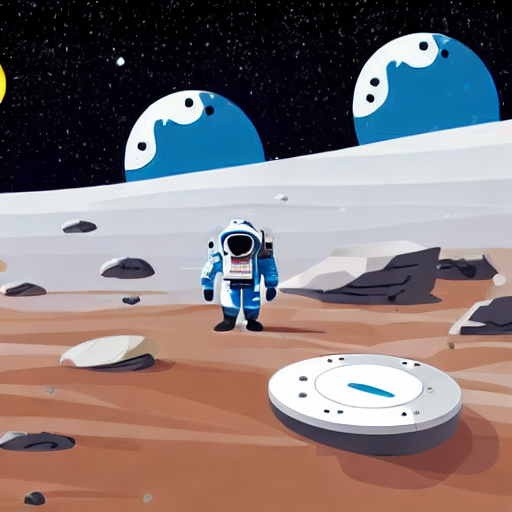

In [13]:
def create_manual_mask(image_size=(512, 512)):
    mask = np.zeros(image_size, dtype=np.uint8)
    mask[150:450, 250:500] = 255
    return Image.fromarray(mask)

# Prompt inpainting satelit
inpaint_prompt = (
    "a damaged broken satellite crashed on the moon surface, "
    "lunar surface with craters, metallic debris, broken panels, exposed mechanical parts, "
    "multi-legged landing gear, "
    "highly detailed mechanical structure, sharp focus, "
    "realistic scale, photorealistic, cinematic lighting"
)
negative_prompt_satellite = "blurry, low quality, distorted, messy, cartoon, drawing, painting"

my_mask = create_manual_mask()

# Tampilkan hasil masking sebelum inpainting agar bisa melihat area yang akan dimodifikasi
print("Hasil Manual Mask (area putih = area yang akan di-inpaint):")
display(my_mask)

# Gunakan image_advanced sebagai base (sesuai saran reviewer)
final_inpaint = inpaint_engine(
    image_advanced,
    my_mask,
    inpaint_prompt,
    negative_prompt=negative_prompt_satellite,
    guidance_scale=12.0,
    num_inference_steps=50
)

print("Hasil Inpainting Manual:")
display(final_inpaint)


## **Inpainting Menggunakan Automasking**

### **load Model Segmentation Untuk Masking**

In [14]:
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-tiny-coco-instance")
segment_model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-tiny-coco-instance").to("cuda")

preprocessor_config.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

The image processor of type `Mask2FormerImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/190M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/566 [00:00<?, ?it/s]

### **Masking with Segmentation Model**

In [15]:
def create_auto_mask(image):
    inputs = processor(images=image, return_tensors="pt").to("cuda")
    with torch.no_grad():
        outputs = segment_model(**inputs)

    prediction = processor.post_process_instance_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]

    seg_map = prediction["segmentation"].cpu().numpy()  # shape: (H, W) berisi label per pixel

    # Buat mask: area yang tersegmentasi (label > 0) dijadikan putih
    mask_array = (seg_map > 0).astype(np.uint8) * 255
    auto_mask = Image.fromarray(mask_array)

    return auto_mask

### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

Auto Mask (Hasil Segmentasi):


Hasil Inpainting Otomatis:


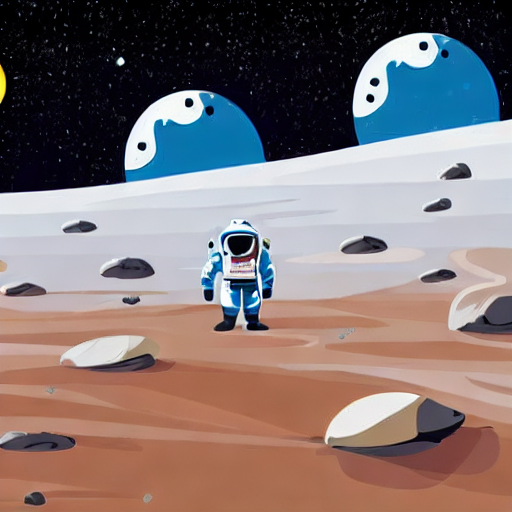

In [16]:
image_to_inpaint = image_advanced

auto_mask = create_auto_mask(image_to_inpaint)

inpaint_prompt_auto = "an astronaut standing next to a futuristic lunar base, high quality, cinematic lighting"
negative_prompt_auto = "blurry, low quality, distorted, ugly, deformed"

print("Auto Mask (Hasil Segmentasi - area putih = area yang akan di-inpaint):")
display(auto_mask)

final_inpaint_auto = inpaint_engine(
    image_to_inpaint,
    auto_mask,
    inpaint_prompt_auto,
    negative_prompt=negative_prompt_auto,
    guidance_scale=10.0,
    num_inference_steps=50
)

print("Hasil Inpainting Otomatis:")
display(final_inpaint_auto)


## **Outpainting**

### **Prepare the Canvas**

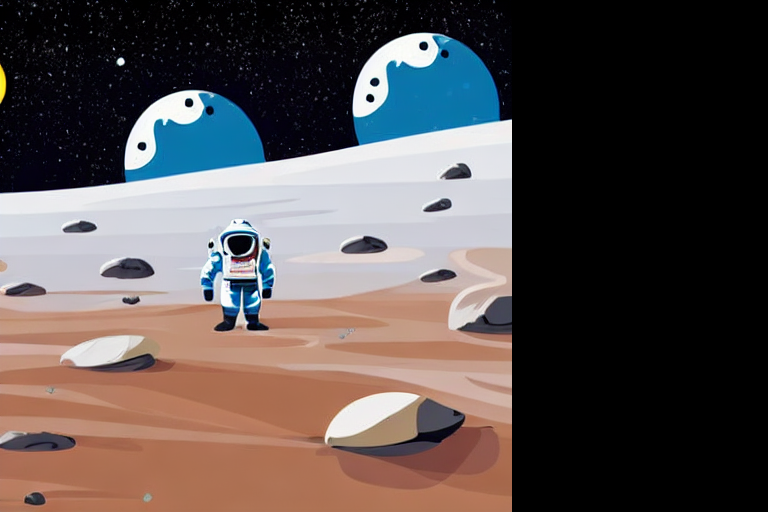

In [17]:
def prepare_outpainting(image, direction="right", pixels=128):
    width, height = image.size
    pixels = pixels - (pixels % 8)

    if direction == "right":
        new_image = Image.new("RGB", (width + pixels, height))
        new_image.paste(image, (0, 0))
        mask = Image.new("L", (width + pixels, height), 0)
        mask.paste(Image.new("L", (pixels, height), 255), (width, 0))
    return new_image, mask

canvas_right, mask_right = prepare_outpainting(image_advanced, direction="right", pixels=256)
display(canvas_right)


### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

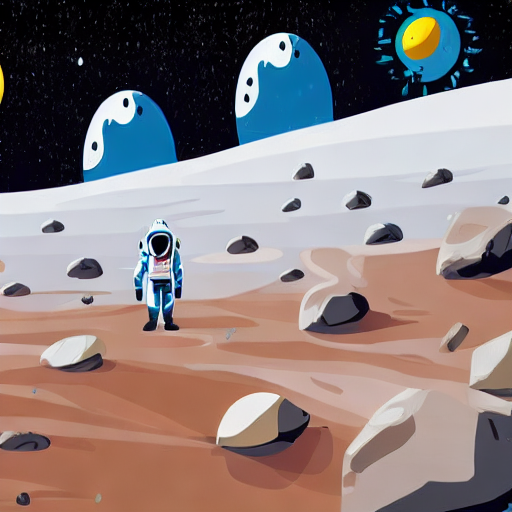

In [18]:
outpaint_prompt = "moon surface with stars, cinematic space background, high resolution"
outpaint_negative = "blurry, low quality, distorted, seam, cut"

canvas_w, canvas_h = canvas_right.size  # gunakan dimensi canvas sebagai parameter

outpaint_result = inpaint_engine(
    canvas_right,
    mask_right,
    outpaint_prompt,
    negative_prompt=outpaint_negative,
    guidance_scale=8.0,
    num_inference_steps=50
)

display(outpaint_result)

## **Outpainting Zoom Out**

### **Prepare Canvas for Zoom Out**

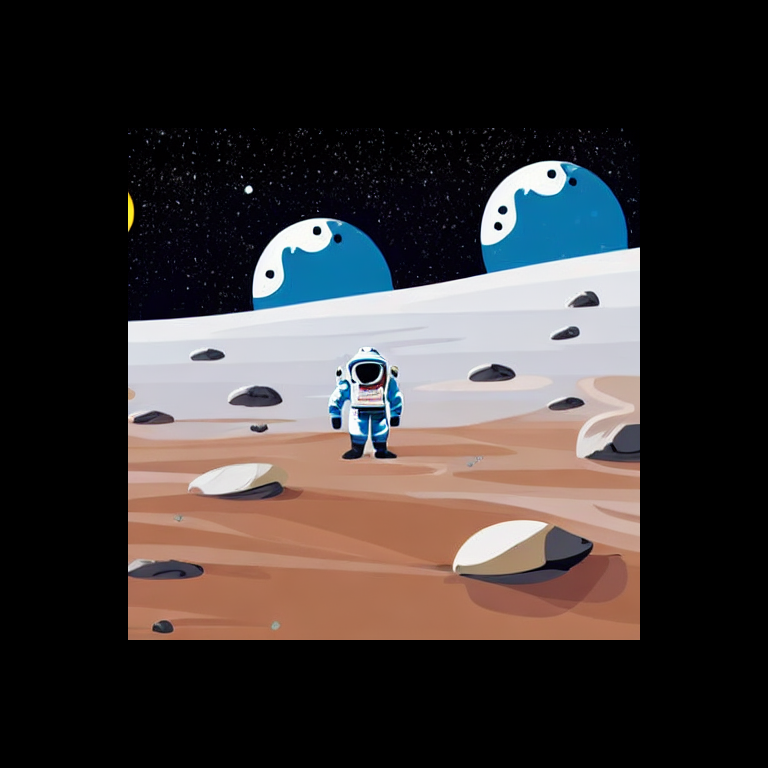

In [19]:
def prepare_zoom_out(image, padding=128):
    width, height = image.size
    new_w = (width + padding*2) - ((width + padding*2) % 8)
    new_h = (height + padding*2) - ((height + padding*2) % 8)

    new_canvas = Image.new("RGB", (new_w, new_h))
    paste_x = (new_w - width) // 2
    paste_y = (new_h - height) // 2
    new_canvas.paste(image, (paste_x, paste_y))

    mask = Image.new("L", (new_w, new_h), 255)
    mask.paste(Image.new("L", (width, height), 0), (paste_x, paste_y))

    return new_canvas, mask

zoom_canvas, zoom_mask = prepare_zoom_out(image_advanced, padding=128)
display(zoom_canvas)


### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

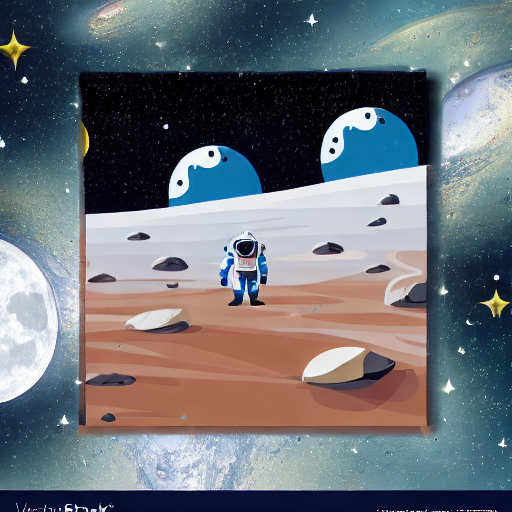

In [20]:
zoom_out_prompt = "outer space stars background, wide angle moon surface, cinematic space"
zoom_out_negative = "blurry, low quality, distorted, seam"

zoom_canvas_w, zoom_canvas_h = zoom_canvas.size  # gunakan dimensi canvas

zoom_out_result = inpaint_engine(
    zoom_canvas,
    zoom_mask,
    zoom_out_prompt,
    negative_prompt=zoom_out_negative,
    guidance_scale=8.0,
    num_inference_steps=50
)

display(zoom_out_result)